# Correlation exploration

We load the 180 patient correlation matrices and perform data visualization and run baseline `sklearn` models.

The dataset contains flattened matrices.

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mlp
import matplotlib.pyplot as plt
import seaborn as sns

In C:\Users\janar\AppData\Local\Programs\Python\Python37\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\janar\AppData\Local\Programs\Python\Python37\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\janar\AppData\Local\Programs\Python\Python37\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In C:\Users\janar\AppData\Local\Programs\Python\Python37\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed tw

In [2]:
DATA_FOLDER = '../data'
PICKLE_FOLDER = '../pickles'

In [3]:
import pickle

with open(f'{PICKLE_FOLDER}/fc.pickle', 'rb') as f:
    fc = pickle.load(f)

with open(f'{PICKLE_FOLDER}/timeseries.pickle', 'rb') as f:
    ts = pickle.load(f)

In [4]:
num_subjects, num_regions, num_points = ts.shape

print(f'Subjects: {num_subjects}')
print(f'Brain regions: {num_regions}')
print(f'Timeseries length: {num_points}')

Subjects: 190
Brain regions: 90
Timeseries length: 400


## Match correlation matrices with raw timeseries correlations

In [5]:
from scipy import stats

### Scipy Pearson coefficient

In [6]:
# pearson_corr = np.ones((num_subjects, num_regions, num_regions))
# for i in range(num_subjects):
#     for r1 in range(num_regions):
#         for r2 in range(r1+1, num_regions):
#             # How I think it should be.
#             pcorr = stats.pearsonr(ts[i][r1], ts[i][r2])[0]
#             # Sorted to mimic normal distribution.
#             pcorr = stats.pearsonr(sorted(ts[i][r1]), sorted(ts[i][r2]))[0]

#             pearson_corr[i][r1][r2] = pcorr
#             pearson_corr[i][r2][r1] = pcorr

### Numpy Pearson coefficient

In [27]:
# np_pearson_corr = np.ones((num_subjects, num_regions, num_regions))

# for i in range(num_subjects):
#     # Numpy correlation.
#     pcorr = np.corrcoef(ts[i])[0]

#     np_pearson_corr[i] = pcorr
#     np_pearson_corr[i] = pcorr

### Scipy Spearman coefficient

In [9]:
# spearman_corr = np.ones((num_subjects, num_regions, num_regions))

# for i in range(num_subjects):
#     for r1 in range(num_regions):
#         for r2 in range(r1+1, num_regions):
#             scorr = stats.spearmanr(ts[i][r1], ts[i][r2])[0]
#             spearman_corr[i][r1][r2] = scorr
#             spearman_corr[i][r2][r1] = scorr

### Pearson coefficient from \[fMRI CLASS\] paper

In [22]:
pearson_corr = np.ones((num_subjects, num_regions, num_regions))
for i in range(num_subjects):
    for r1 in range(num_regions):
        for r2 in range(r1+1, num_regions):
            ts1 = ts[i][r1]
            ts2 = ts[i][r2]

            pcorr = (ts1 @ ts2) / ((ts1 @ ts1)**0.5 * (ts2 @ ts2)**0.5)

            pearson_corr[i][r1][r2] = pcorr
            pearson_corr[i][r2][r1] = pcorr


In [9]:
# import pickle

# with open(PICKLE_FOLDER + '/fc-pearson.pickle', 'wb') as f:
#     pickle.dump(pearson_corr, f)

# with open(PICKLE_FOLDER + '/fc-spearman.pickle', 'wb') as f:
#     pickle.dump(spearman_corr, f)

### ! ODD ! We are not able to match the FC data onto our computed correlations !

In [44]:
# epsilon = 0.01
# count = 0

# for i in range(180):
#     max_sum = -1
#     for j in range(190):
#         next_sum = np.count_nonzero(np.abs(fc[i]-pearson_corr[j])  < epsilon)
#         if next_sum > max_sum:
#             min_i = i
#             min_j = j
#             max_sum = next_sum

#     print(f'[{count:3d}][{num_regions**2 - max_sum:2d}] Pair [{min_i}] [{min_j}]')
#     count += 1


Conclusion: all Pearson coefficients are equal. Brain regions are probably sorted differently in the two datasets, so values don't match.

## Explore matrices dataset

In [10]:
df = pd.read_csv(f'{DATA_FOLDER}/reshaped.csv', header=None)

In [11]:
total_samples, total_features = df.shape

In [12]:
target_index_change = 90

In [13]:
print('Samples: ', total_samples)
print('Features: ', total_features)
print('Index where target feature changes: ', target_index_change)

Samples:  180
Features:  8100
Index where target feature changes:  90


In [14]:
df.iloc[90,:]

0       1.000000
1       0.700473
2       0.284556
3       0.221322
4       0.349505
          ...   
8095    0.776167
8096    0.350778
8097    0.373803
8098    0.731264
8099    1.000000
Name: 90, Length: 8100, dtype: float64

In [15]:
def reshape_to_matrix(data):
    """
    Reshapes flattend array to NxN matrix.
    """
    size = len(data) ** 0.5  # Dimension of the square matrix.
    assert size % 1 == 0, f'Cannot convert to square matrix. Invalid length of data: {len(data)}.'
    return data.reshape(int(size), int(size))

In [16]:
reshape_to_matrix(df.iloc[0,:].values)

array([[1.        , 0.66244464, 0.33036293, ..., 0.1562867 , 0.56205455,
        0.4291976 ],
       [0.66244464, 1.        , 0.43291723, ..., 0.28361584, 0.68718241,
        0.67175882],
       [0.33036293, 0.43291723, 1.        , ..., 0.51793205, 0.48466784,
        0.62091072],
       ...,
       [0.1562867 , 0.28361584, 0.51793205, ..., 1.        , 0.45928225,
        0.58759492],
       [0.56205455, 0.68718241, 0.48466784, ..., 0.45928225, 1.        ,
        0.84691387],
       [0.4291976 , 0.67175882, 0.62091072, ..., 0.58759492, 0.84691387,
        1.        ]])

In [17]:
def plot_covariances(sample=0):
    """
    Displays heatmap of `sample`th covariance matrix from `df`.
    """
    covariances = df.iloc[sample,:].values
    covariance_matrix = reshape_to_matrix(covariances)
    
    sns.heatmap(covariance_matrix, cmap="YlGnBu")

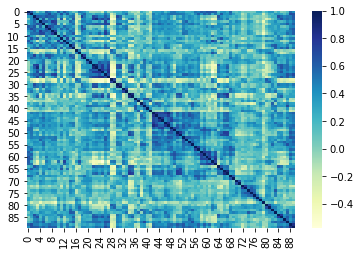

In [18]:
plot_covariances(0)


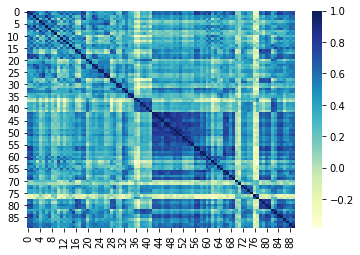

In [19]:
plot_covariances(80)

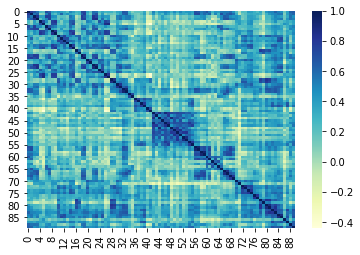

In [20]:
plot_covariances(179)

In [21]:
def plot_variances(start=0, end=-1):
    """
    Plots variance of covariances on samples from `df[start:end]`.
    """
    covariances = df.iloc[start:end,:]
    variances = np.var(covariances).values
    variance_matrix = reshape_to_matrix(variances)
    
    sns.heatmap(variance_matrix, cmap="YlGnBu")
    

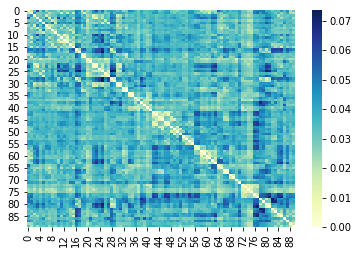

In [22]:
# All samples
plot_variances()

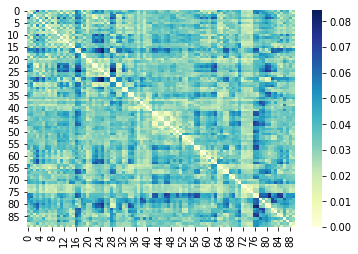

In [23]:
# Healthy subjects
plot_variances(end=target_index_change)

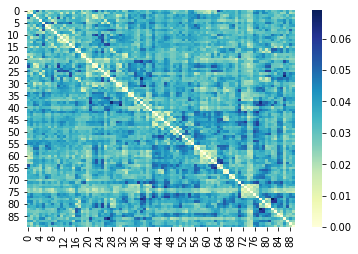

In [24]:
# Patient subjects
plot_variances(start=target_index_change)

## Probe baseline ML models

In [25]:
# All sklearn imports.
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier

In [26]:
# Append target class.
df['target'] = 0
df.loc[target_index_change:, 'target'] = 1

In [27]:
# Shuffle data
seed = 42 # Answer to the Ultimate Question of Life, the Universe, and Everything.
df_shuffled = df.sample(frac=1, random_state=seed)

In [28]:
# Train / test splits for cross validation.
# 75 / 25.
X_train, X_test, y_train, y_test = train_test_split(df_shuffled.iloc[:,:total_features], df_shuffled['target'], test_size=0.25, random_state=seed)

print("Train size: ", len(y_train))
print("Test size: ", len(y_test))

Train size:  135
Test size:  45


In [29]:
print("Patient / control ratio train: ", sum(y_train) / len(y_train))
print("Patient / control ratio test: ", sum(y_test) / len(y_test))

Patient / control ratio train:  0.5037037037037037
Patient / control ratio test:  0.4888888888888889


In [30]:
def confusion_matrix_custom(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    print(f"Accuracy: {(tp+tn)/(fn+tp+tn+fp):.2f}")
    print(f"Recall: {tp}/{fn+tp} ({tp/(fn+tp):.2f})")
    print(f"Precision: {tp}/{tp+fp} ({tp/(tp+fp):.2f})")
    print()

In [31]:
grid_kwargs = {"cv": 7, "n_jobs": -1}

In [32]:
def cross_validate(estimator, estimator_params, grid_kwargs=grid_kwargs):
    """
    Performs cross-validation using train dataset on estimator.
    Optionally takes grid search settings.
    """
    grid = GridSearchCV(estimator, estimator_params, **grid_kwargs)
    grid.fit(X_train, y_train)
    results = pd.DataFrame(grid.cv_results_)
    y_pred = grid.best_estimator_.predict(X_test)
    confusion_matrix_custom(y_test.values, y_pred)

    print(results.sort_values(by=['rank_test_score']).head(10))

## Baseline Models
- KNN
- Naive Bayes
- Random Forest
- SVM
- Elastic Net based logistic regression
- Convolutional Net

In [33]:
# Naive Bayes
knn = KNeighborsClassifier()
knn_params = {"n_neighbors": [1, 2, 3, 5]}
cross_validate(knn, knn_params)

Accuracy: 0.67
Recall: 12/22 (0.55)
Precision: 12/17 (0.71)

   mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
3       0.126391      0.013280         0.065724        0.015778   
2       0.129656      0.005913         0.081156        0.017701   
0       0.184325      0.016784         0.145126        0.012398   
1       0.140874      0.021910         0.082071        0.026996   

  param_n_neighbors              params  split0_test_score  split1_test_score  \
3                 5  {'n_neighbors': 5}               0.55                0.7   
2                 3  {'n_neighbors': 3}               0.60                0.7   
0                 1  {'n_neighbors': 1}               0.65                0.7   
1                 2  {'n_neighbors': 2}               0.65                0.6   

   split2_test_score  split3_test_score  split4_test_score  split5_test_score  \
3           0.684211           0.684211           0.578947           0.526316   
2           0.736842           0.57

In [34]:
# Naive Bayes
gnb = GaussianNB()
gnb_params = {"var_smoothing": [1e-10, 1e-9, 1e-8]}
cross_validate(gnb, gnb_params)

Accuracy: 0.64
Recall: 16/22 (0.73)
Precision: 16/26 (0.62)

   mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0       0.095019      0.011978         0.034644        0.009891   
1       0.098785      0.014362         0.027486        0.004345   
2       0.089021      0.017726         0.026382        0.010248   

  param_var_smoothing                    params  split0_test_score  \
0                 0.0  {'var_smoothing': 1e-10}               0.65   
1                 0.0  {'var_smoothing': 1e-09}               0.65   
2                 0.0  {'var_smoothing': 1e-08}               0.65   

   split1_test_score  split2_test_score  split3_test_score  split4_test_score  \
0               0.65           0.578947           0.736842           0.842105   
1               0.65           0.578947           0.736842           0.842105   
2               0.65           0.578947           0.736842           0.842105   

   split5_test_score  split6_test_score  mean_test_score  std_te

In [35]:
# Random forest.
rf = RandomForestClassifier()
rf_params = {"max_depth": [1,2,3,5], "criterion": ("entropy", "gini")}
cross_validate(rf, rf_params)

Accuracy: 0.71
Recall: 18/22 (0.82)
Precision: 18/27 (0.67)

   mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
5       0.445545      0.033039         0.032745        0.005167   
2       0.809055      0.107241         0.037450        0.017071   
6       0.506220      0.028061         0.032557        0.006134   
4       0.449986      0.039235         0.036816        0.011174   
3       1.074988      0.123518         0.042294        0.012006   
0       0.430119      0.010761         0.064357        0.010940   
7       0.532298      0.042614         0.024993        0.005863   
1       0.598318      0.054413         0.032186        0.003958   

  param_criterion param_max_depth                                    params  \
5            gini               2     {'criterion': 'gini', 'max_depth': 2}   
2         entropy               3  {'criterion': 'entropy', 'max_depth': 3}   
6            gini               3     {'criterion': 'gini', 'max_depth': 3}   
4            gini  

In [36]:
# SVC.
svc = SVC()
svc_params = {"C": [1, 10, 100], "kernel": ("poly", "rbf", "sigmoid"), "degree": [2,3]}
cross_validate(svc, svc_params)

Accuracy: 0.69
Recall: 17/22 (0.77)
Precision: 17/26 (0.65)

    mean_fit_time  std_fit_time  mean_score_time  std_score_time param_C  \
15       0.379770      0.021884         0.058970        0.005235     100   
9        0.372643      0.025341         0.062407        0.007583      10   
12       0.373467      0.019117         0.059932        0.006062     100   
6        0.361343      0.014993         0.064030        0.006833      10   
3        0.395830      0.049448         0.061399        0.007190       1   
13       0.376896      0.019586         0.069194        0.005789     100   
7        0.390512      0.021077         0.073321        0.010068      10   
16       0.383927      0.032730         0.073331        0.009850     100   
10       0.381134      0.014273         0.070493        0.007615      10   
0        0.351262      0.017700         0.053117        0.005379       1   

   param_degree param_kernel                                     params  \
15            3         pol

In [37]:
# Elastic Net.
eln = SGDClassifier()
eln_params = {"loss": ["log"], "alpha": [0.1, 0.01, 0.001], "penalty": ["elasticnet"], "l1_ratio": [0.15, 0.25, 0.5, 0.7]}
cross_validate(eln, eln_params)

Accuracy: 0.76
Recall: 15/22 (0.68)
Precision: 15/19 (0.79)

    mean_fit_time  std_fit_time  mean_score_time  std_score_time param_alpha  \
7        0.282113      0.019496         0.018648        0.004400        0.01   
6        0.331242      0.050318         0.017405        0.008883        0.01   
5        0.385880      0.035991         0.016628        0.003306        0.01   
10       0.320099      0.037203         0.015097        0.004160       0.001   
9        0.349655      0.042349         0.017543        0.004604       0.001   
11       0.311604      0.022052         0.014715        0.001935       0.001   
1        0.224229      0.056476         0.016728        0.003429         0.1   
4        0.350732      0.054609         0.016495        0.003375        0.01   
0        0.231536      0.059901         0.017709        0.005664         0.1   
8        0.336058      0.074836         0.018423        0.005293       0.001   

   param_l1_ratio param_loss param_penalty  \
7           

## Convolutional net on covariance matrices

In [35]:
# Train / dev / test splits for standard approach.
# 70 / 15 / 15.
X_train_dev, X_test, y_train_dev, y_test = train_test_split(df_shuffled.iloc[:,:total_features], df_shuffled['target'], test_size=0.15, random_state=seed)
X_train, X_dev, y_train, y_dev = train_test_split(X_train_dev, y_train_dev, test_size=0.17, random_state=seed)

print("Train size: ", len(y_train))
print("Dev size: ", len(y_dev))
print("Test size: ", len(y_test))

Train size:  126
Dev size:  27
Test size:  27


In [36]:
conv_train = X_train.values.reshape(-1, 90,90,1)
conv_dev = X_dev.values.reshape(-1, 90,90,1)
conv_test = X_test.values.reshape(-1, 90,90,1)

In [37]:
# Convolutional neural network.
inputs = tf.keras.layers.Input(shape=[90, 90, 1])
hidden = tf.keras.layers.Conv2D(2, 3, 1, "same", activation=tf.nn.relu)(inputs)
hidden = tf.keras.layers.Conv2D(2, 3, 1, "same", activation=tf.nn.relu)(inputs)
hidden = tf.keras.layers.MaxPool2D(2)(hidden)

hidden = tf.keras.layers.Flatten()(hidden)
hidden = tf.keras.layers.Dense(units=8, activation=tf.nn.relu)(hidden)
outputs = tf.keras.layers.Dense(units=1, activation=tf.nn.sigmoid)(hidden)

model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss=tf.keras.losses.BinaryCrossentropy(),
    metrics=[tf.keras.metrics.BinaryAccuracy()],
)
model.fit(x=conv_train, y=y_train, epochs=500, validation_data=(conv_dev, y_dev))

NameError: name 'tf' is not defined